In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from scipy.optimize import least_squares

# Set seeds for reproducibility
np.random.seed(42)  # Seed for NumPy operations
cv2.setRNGSeed(42)  # Seed for OpenCV operations
random.seed(42)     # Seed for Python random operations

### Step-1: Image Preprocessing and Normalization

In [2]:
def load_image(image_path):
    """
    Load an image from the specified path.
    """
    image = cv2.imread(image_path)  # Load image in grayscale
    if image is None:
        raise ValueError(f"Image at {image_path} could not be loaded.")
    return image

def load_images_from_folder(folder_path):
    """
    Load all images from the specified folder.
    """
    images = [] 
    image_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('png', 'jpg', 'jpeg', 'bmp', 'tif'))]
        
    if not image_files:
        raise ValueError(f"No images found in the folder: {folder_path}")
    
    for filename in image_files:
        img_path = os.path.join(folder_path, filename)
        image = cv2.imread(img_path)
        if image is not None:
            images.append((filename, image))
        else:
            print(f"Warning: {filename} could not be loaded.")
    
    return images

def normalize_image(image):
    """
    Normalize the image using initial normalization, grayscale conversion, and CLAHE.
    """
    # Initial Normalization to spread the pixel intensities over the full range [0, 255]
    pixel_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

    # Convert to grayscale if the image is in color (3 channels)
    if len(pixel_image.shape) == 3:
        pixel_image_convert = cv2.cvtColor(pixel_image, cv2.COLOR_BGR2GRAY)
    
    # CLAHE (Contrast Limited Adaptive Histogram Equalization) - Local Contrast Enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(pixel_image_convert)
    
    return clahe_image, pixel_image


def plot_images(original, clahe, title=''):
    """
    Display the original, histogram equalized, and CLAHE normalized images.
    """
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title(f'Original Image\n{title}')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(clahe, cmap='gray')
    plt.title('CLAHE Normalization')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

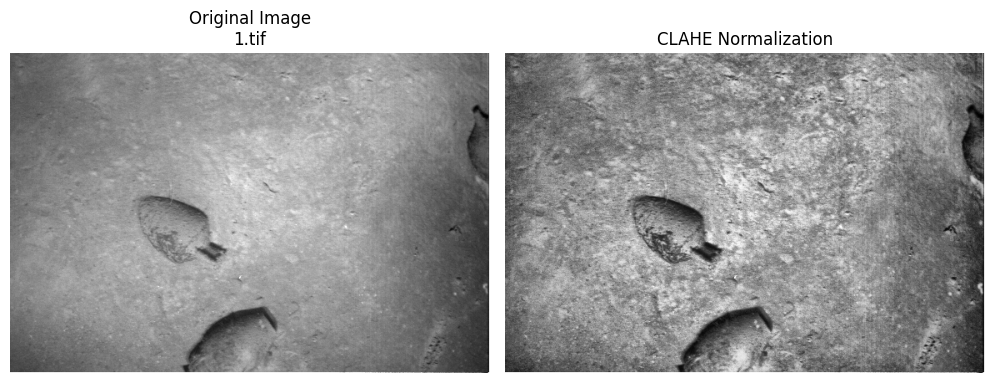

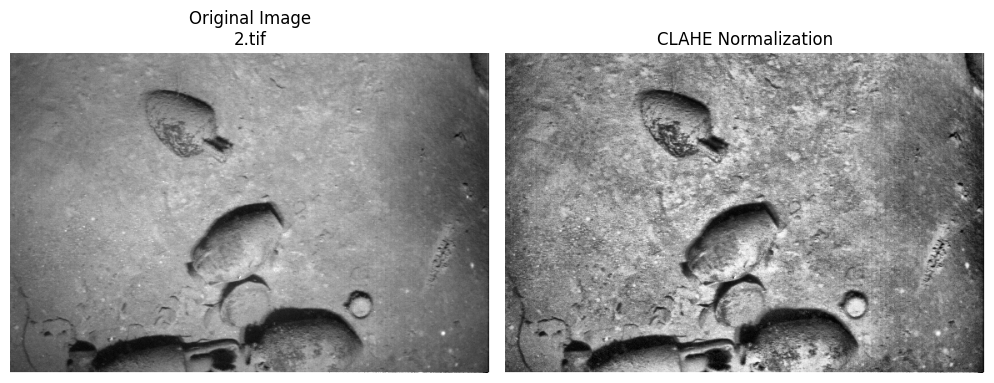

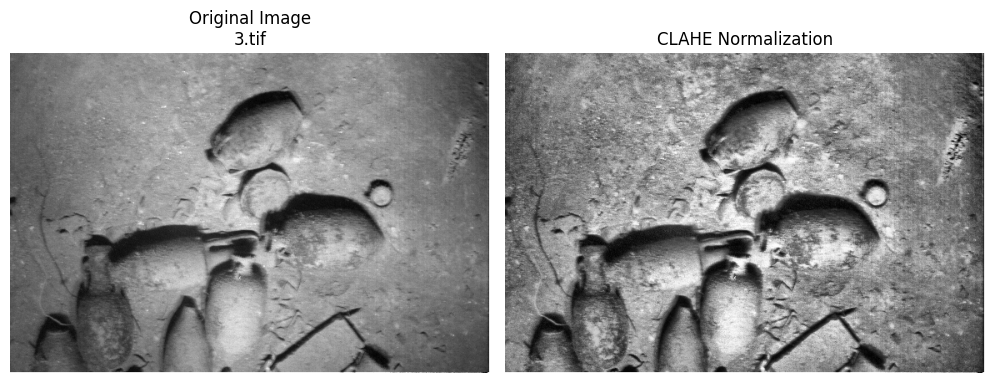

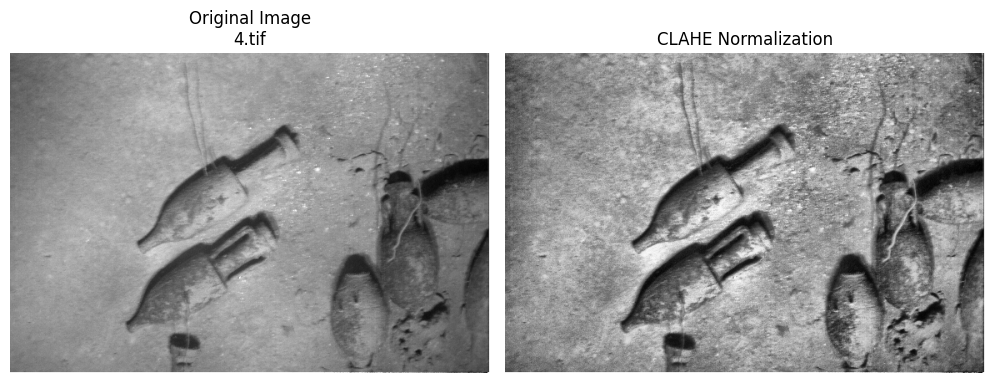

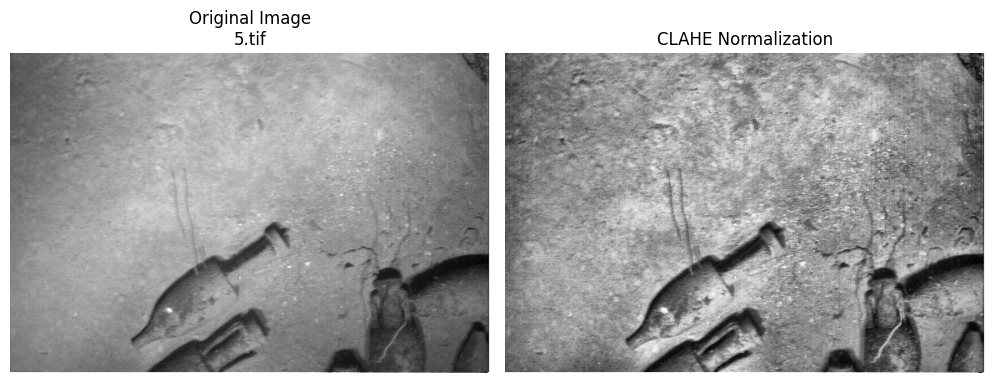

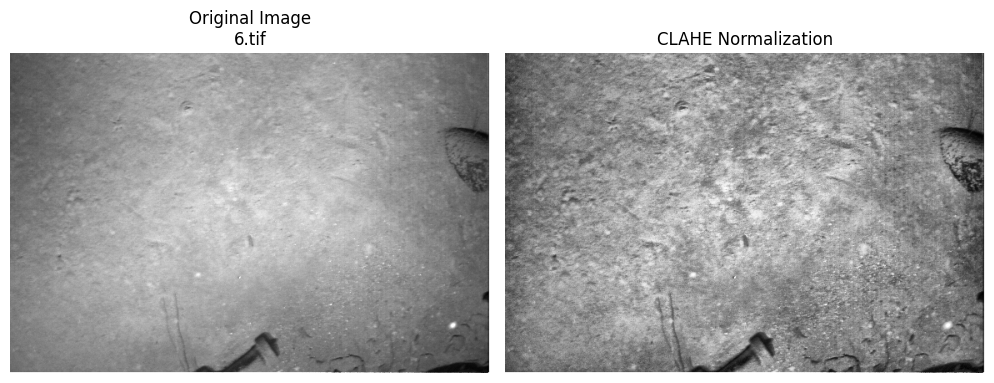

In [3]:
# Execute this cell to run the functions

# Replace with the path to your folder containing images
folder_path = '6Images'
images = load_images_from_folder(folder_path)

# Process and plot each image
for filename, image in images:
    clahe_image, normalized_image = normalize_image(image)
    plot_images(image, clahe_image, title=filename)


### Step-2: SIFT Feature Detection and Description

In [4]:
def detect_and_describe_features(image):
    """
    Detect keypoints and compute descriptors using SIFT with adjusted parameters.
    """
    # Initialize the SIFT detector with custom parameters
    sift = cv2.SIFT_create(nfeatures=5000, contrastThreshold=0.025, edgeThreshold=10, nOctaveLayers=16, sigma=1.4)
    
    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(image, None)
    
    print(f"Detected {len(keypoints)} keypoints.")
    return keypoints, descriptors



def plot_keypoint(normalized, keypoints):
    """
    Display the normalized image, and the image with detected keypoints.
    """
    # Draw keypoints on the normalized image
    image_with_keypoints = cv2.drawKeypoints(normalized, keypoints, normalized, color=[0,255,0], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(normalized, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(image_with_keypoints, cmap='gray')
    plt.title('Detected Keypoints')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Detected 5000 keypoints.


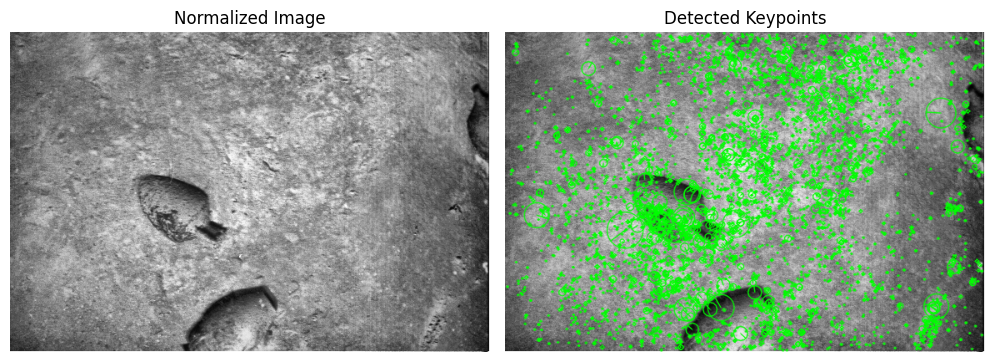

Detected 5000 keypoints.


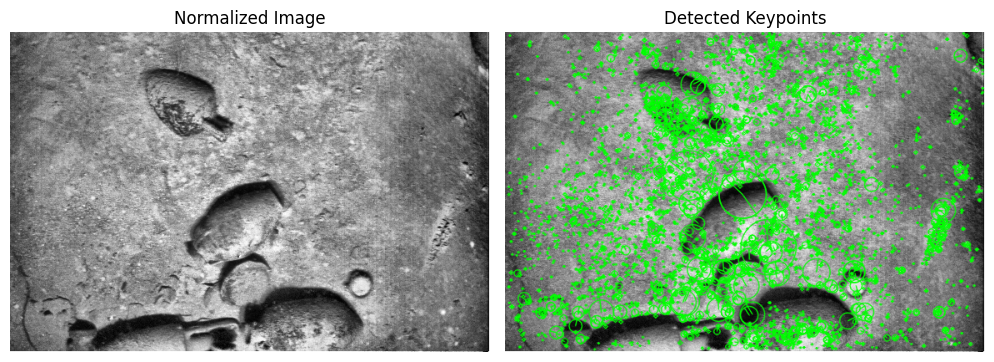

Detected 5000 keypoints.


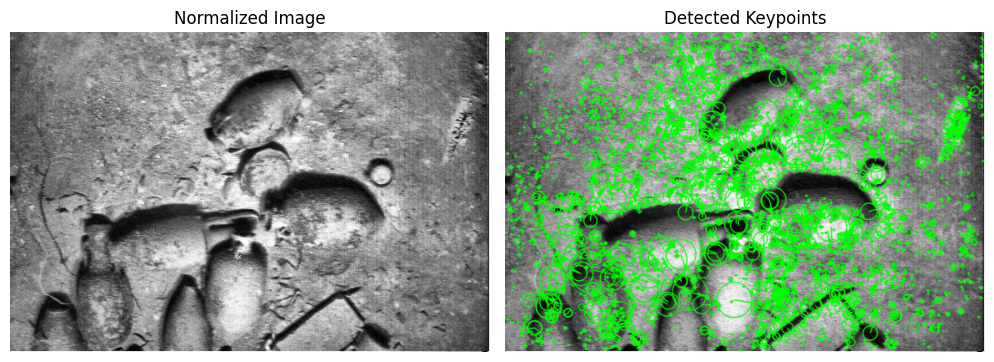

Detected 5001 keypoints.


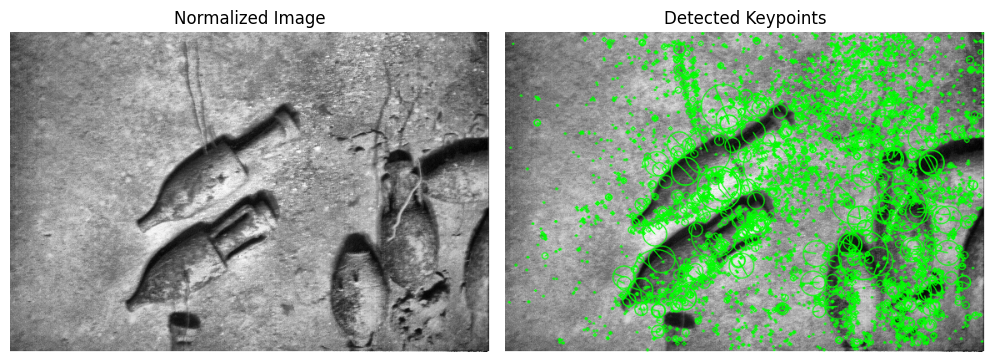

Detected 5000 keypoints.


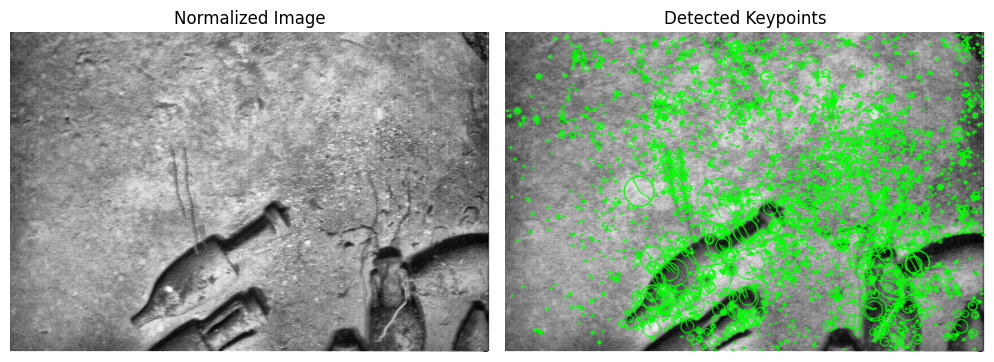

Detected 5000 keypoints.


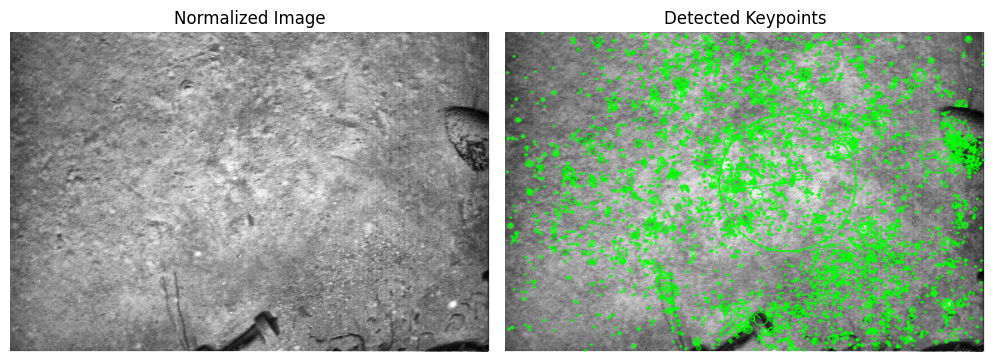

In [5]:
# Execute this cell to run the functions for step-2
# Set seeds for reproducibility
np.random.seed(42)  # Seed for NumPy operations
cv2.setRNGSeed(42)  # Seed for OpenCV operations
random.seed(42)     # Seed for Python random operations

keypoint_store = []
descriptor_store = []

normalized = []
pixel = []

# Process and plot each image
for filename, image in images:
    
    clahe_image, normalized_image = normalize_image(image) 
    normalized.append(clahe_image)
    pixel.append(normalized_image)   

    # Detect and describe features on the normalized image
    keypoints, descriptors = detect_and_describe_features(clahe_image)

    keypoint_store.append(np.array(keypoints))
    descriptor_store.append(np.array(descriptors))
    
    # Plot the normalized image and the keypoints
    plot_keypoint(clahe_image, keypoints)

### Step-3: Feature Matching

In [6]:
def match_features(descriptors1, descriptors2, keypoints1, keypoints2):
    """
    Match features between two sets of descriptors using FLANN-based matcher.
    """
    # Set seeds for reproducibility
    np.random.seed(42)  # Seed for NumPy operations
    cv2.setRNGSeed(42)  # Seed for OpenCV operations
    random.seed(42)     # Seed for Python random operations
    
    # Define FLANN-based matcher parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)  # Higher number of checks for better precision
    
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Match descriptors using KNN approach
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    
    # Filter matches using the ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
    
    # Extract source and destination points
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    print(f"Found {len(good_matches)} good matches.")
    return good_matches, (src_pts, dst_pts)

def match_keypoints_across_images(keypoint_store, descriptor_store):
    """
    Compare keypoints and descriptors from a series of images to discover matching points between consecutive image pairs.
    """
    collected_matches = []

    # Handle the wrap-around case for the last image depending on the length of keypoints list
    num_images = len(keypoint_store)
    
    if num_images == 6:
        wrap_index = 0
    elif num_images == 28:
        wrap_index = 13
    else:
        raise RuntimeError("This code doesn't work on a datasets of only 6 and 29 images.")

    # Traverse each image and match it with the next in sequence
    for current_img_idx in range(num_images):
        # Determine the index of the image to match with (wrapping if necessary)
        next_img_idx = (current_img_idx + 1) % num_images if current_img_idx != num_images - 1 else wrap_index
        
        # Call the match function for the current image and the next one
        good_matches, (src_points, dst_points) = match_features(descriptor_store[current_img_idx], descriptor_store[next_img_idx], 
                                                keypoint_store[current_img_idx], keypoint_store[next_img_idx])
        
        collected_matches.append((src_points, dst_points))
        
        print(f"Processed Image {current_img_idx}, Matching with {next_img_idx}: Found {len(src_points)} matches.")

    return collected_matches


def plot_matching_results(img1, img2, images, keypoint_store, matches):
    """
    Display the matching keypoints between two images.
    """
    # Draw matches
    matching_result = cv2.drawMatches(images[img1], keypoint_store[img1], images[img2], keypoint_store[img2], matches, None, matchColor=[255, 255, 0],
                                      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(matching_result)
    plt.title('Feature Matching without RANSAC')
    plt.axis('off')
    plt.show()


Found 545 good matches.
Processed Image 0, Matching with 1: Found 545 matches.
Found 501 good matches.
Processed Image 1, Matching with 2: Found 501 matches.
Found 50 good matches.
Processed Image 2, Matching with 3: Found 50 matches.
Found 565 good matches.
Processed Image 3, Matching with 4: Found 565 matches.
Found 403 good matches.
Processed Image 4, Matching with 5: Found 403 matches.
Found 50 good matches.
Processed Image 5, Matching with 0: Found 50 matches.
Found 403 good matches.


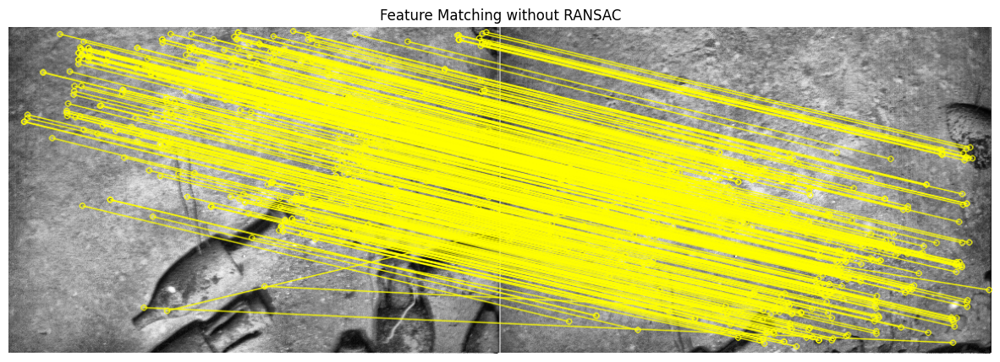

In [7]:
# Match features between the two images
collected_matches = match_keypoints_across_images(keypoint_store, descriptor_store)

# # Plot the matching results
im1=4
im2=5

good_matches, (src, dst) = match_features(descriptor_store[im1], descriptor_store[im2], keypoint_store[im1], keypoint_store[im2])
plot_matching_results(im1, im2, normalized, keypoint_store, good_matches)

### Step-4: RANSAC & Homography Calculations

In [8]:
# # Compute the homography matrix with any number of points
# def compute_homography(pts_src, pts_dst):
    # A = []
    # for i in range(len(pts_src)):  # Adjust for any number of points, not just 4
    #     x, y = pts_src[i][0], pts_src[i][1]
    #     x_prime, y_prime = pts_dst[i][0], pts_dst[i][1]

    #     A.append([-x, -y, -1, 0, 0, 0, x_prime * x, x_prime * y, x_prime])
    #     A.append([0, 0, 0, -x, -y, -1, y_prime * x, y_prime * y, y_prime])

    # A = np.array(A)

    # # Perform SVD to solve Ah = 0 in a least squares sense
    # U, S, Vh = np.linalg.svd(A)
    # h = Vh[-1, :]  # Solution is the last row of Vh

    # # Reshape h into a 3x3 matrix
    # H = h.reshape((3, 3))
    # return H

# def compute_reprojection_error(H, src_pts, dst_pts):
#     """Compute the reprojection error between source and destination points given a homography matrix H."""
    
#     num_points = src_pts.shape[0]
    
#     # Convert points to homogeneous coordinates
#     src_pts_homog = np.hstack([src_pts, np.ones((num_points, 1))])
#     projected_pts = np.dot(H, src_pts_homog.T).T  # Project src_pts using the homography
#     projected_pts /= projected_pts[:, 2][:, np.newaxis]  # Normalize by the third coordinate (homogeneous division)
    
#     # Compute Euclidean distance between projected points and dst_pts
#     error = np.linalg.norm(dst_pts - projected_pts[:, :2], axis=1)
#     return error

# def ransac_homography(src_pts, dst_pts, num_iterations=1000, reprojection_threshold=2.0):
#     """Compute the homography matrix using RANSAC."""  
#     best_homography = None
#     max_inliers = 0
#     best_mask = None

#     num_points = src_pts.shape[0]
    
#     # Ensure we have enough points for RANSAC
#     if num_points < 4:
#         return None, np.zeros(num_points, dtype=np.uint8)  # Not enough points for homography
    
#     for _ in range(num_iterations):
#         # Randomly select 4 points for homography computation
#         random_indices = random.sample(range(num_points), 4)
#         src_sample = src_pts[random_indices]
#         dst_sample = dst_pts[random_indices]

#         # Compute homography using the sampled points
#         H = compute_homography(src_sample, dst_sample)

#         # Calculate reprojection error for all points
#         errors = compute_reprojection_error(H, src_pts, dst_pts)

#         # Identify inliers based on the reprojection error
#         inliers_mask = errors < reprojection_threshold
#         num_inliers = np.sum(inliers_mask)

#         # Keep track of the best homography (with the most inliers)
#         if num_inliers > max_inliers:
#             max_inliers = num_inliers
#             best_homography = H
#             best_mask = inliers_mask
    
#     # Return the best homography matrix and the inlier mask
#     return best_homography, best_mask.astype(np.uint8)

# def generate_homography_matrix(matches):
#     """
#     Compute the homography matrix using the custom function with RANSAC.
#     """
#     homography_list = []
#     src_points_list = []
#     dst_points_list = []
#     result_masks = []

#     # Process each pair of keypoint matches from the input
#     for match_set in matches:
#         left_keypoints = [point for point in match_set[0]]  # Extract left-side keypoints
#         right_keypoints = [point for point in match_set[1]]  # Extract right-side keypoints

#         # Convert lists to float32 NumPy arrays required for homography calculations
#         src_points = np.asarray(left_keypoints, dtype=np.float32)
#         dst_points = np.asarray(right_keypoints, dtype=np.float32)

#         # Ensure we have enough points
#         if len(src_points) >= 4 and len(dst_points) >= 4:
#             # Use RANSAC to compute the homography and mask
#             homography, mask = ransac_homography(src_points, dst_points)

#             homography_list.append(homography)
#             result_masks.append(mask)

#             # Calculate the number of inliers and outliers based on the mask
#             inliers_count = np.sum(mask)  # Inliers are marked with 1 in the mask
#             total_points = mask.shape[0]  # Total number of points in the match set
#             outliers_count = total_points - inliers_count  # Outliers are the remaining points

#             print(f"Computed homography for match set:")
#             print(f" - Total points: {total_points}")
#             print(f" - Inliers (selected by RANSAC): {inliers_count}")
#             print(f" - Outliers (rejected by RANSAC): {outliers_count}")
#         else:
#             print(f"Not enough points to compute homography. Need at least 4 points, got {len(src_points)}.")
#             homography_list.append(None)
#             result_masks.append(None)

#     # Return the list of homography matrices, masks, and point sets
#     return homography_list, result_masks, (src_points_list, dst_points_list)


# Set seeds for reproducibility
np.random.seed(42)  # Seed for NumPy operations
cv2.setRNGSeed(42)  # Seed for OpenCV operations
random.seed(42)     # Seed for Python random operations

def generate_homography_matrix(matches):


    homography_list = []
    src_points_list = []
    dst_points_list = []
    result_masks = []

    # Process each pair of keypoint matches from the input
    for match_set in matches:
        left_keypoints = [point for point in match_set[0]]  # Extract left-side keypoints
        right_keypoints = [point for point in match_set[1]]  # Extract right-side keypoints

        # Convert lists to float32 NumPy arrays required for homography calculations
        src_points_list.append(np.asarray(left_keypoints, dtype=np.float32))
        dst_points_list.append(np.asarray(right_keypoints, dtype=np.float32))

    # For each pair of points, compute the homography matrix using RANSAC algorithm
    for idx, (src_points, dst_points) in enumerate(zip(src_points_list, dst_points_list)):
        homography, mask = cv2.findHomography(dst_points, src_points, cv2.RANSAC, ransacReprojThreshold=3.0)
        homography_list.append(homography)
        result_masks.append(mask)
        
        # Calculate the number of inliers and outliers based on the mask
        inliers_count = np.sum(mask)  # Inliers are marked with 1 in the mask
        total_points = mask.shape[0]  # Total number of points in the match set
        outliers_count = total_points - inliers_count  # Outliers are the remaining points

        print(f"Computed homography for match set {idx}:")
        print(f" - Total points: {total_points}")
        print(f" - Inliers (selected by RANSAC): {inliers_count}")
        print(f" - Outliers (rejected by RANSAC): {outliers_count}")

    # Return the list of homography matrices, masks, and point sets
    return homography_list, result_masks, (src_points_list, dst_points_list)

def plot_matching_results_RANSAC(img1, img2, Mask_matrix, images, keypoint_store, matches):
    """
    Display the matching keypoints between two images.
    """
    # Draw matches
    matching_result = cv2.drawMatches(images[img1], keypoint_store[img1], images[img2], keypoint_store[img2], matches, None, matchColor=[255, 255, 0], 
                                      matchesMask = Mask_matrix[0].ravel().tolist(),
                                      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(matching_result)
    plt.title('Feature Matching with RANSAC')
    plt.axis('off')
    plt.show()


**The commented code in the above cell contains functions which I had defined in my previous HW-2 file. However, my custom Homography function along with RANSAC doesn't work well as the system crashes. I had to use OpenCV's homography function which has RANSAC for Homography estimation.**

Found 403 good matches.
Computed homography for match set 0:
 - Total points: 403
 - Inliers (selected by RANSAC): 288
 - Outliers (rejected by RANSAC): 115.0


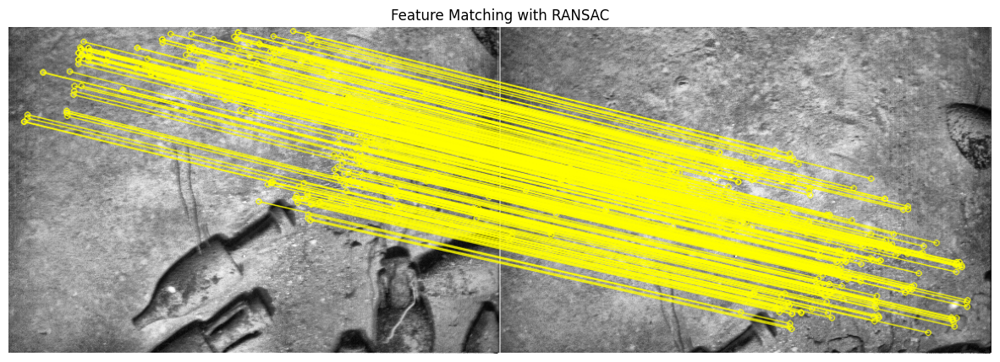

In [9]:
im1=4
im2=5

good_matches, (src, dst) = match_features(descriptor_store[im1], descriptor_store[im2], keypoint_store[im1], keypoint_store[im2])

# Make sure that src and dst are 2D arrays with points in (x, y) format
src = np.asarray(src).reshape(-1, 2)
dst = np.asarray(dst).reshape(-1, 2)

H_matrix, Mask_matrix, _ = generate_homography_matrix([(src, dst)])

plot_matching_results_RANSAC(im1, im2, Mask_matrix, normalized, keypoint_store, good_matches)

In [10]:
# Set seeds for reproducibility
np.random.seed(42)  # Seed for NumPy operations
cv2.setRNGSeed(42)  # Seed for OpenCV operations
random.seed(42)     # Seed for Python random operations

# After generating collected_matches
for i, (src_pts, dst_pts) in enumerate(collected_matches):
    # Reshape each pair of source and destination points to ensure they have the shape (n_points, 2)
    src_pts = np.asarray(src_pts).reshape(-1, 2)
    dst_pts = np.asarray(dst_pts).reshape(-1, 2)

    # Update the collected_matches with the reshaped points
    collected_matches[i] = (src_pts, dst_pts)

# Now, use the modified collected_matches for further operations
H1_matrix, M1_matrix, _ = generate_homography_matrix(collected_matches)


Computed homography for match set 0:
 - Total points: 545
 - Inliers (selected by RANSAC): 378
 - Outliers (rejected by RANSAC): 167.0
Computed homography for match set 1:
 - Total points: 501
 - Inliers (selected by RANSAC): 302
 - Outliers (rejected by RANSAC): 199.0
Computed homography for match set 2:
 - Total points: 50
 - Inliers (selected by RANSAC): 22
 - Outliers (rejected by RANSAC): 28.0
Computed homography for match set 3:
 - Total points: 565
 - Inliers (selected by RANSAC): 388
 - Outliers (rejected by RANSAC): 177.0
Computed homography for match set 4:
 - Total points: 403
 - Inliers (selected by RANSAC): 288
 - Outliers (rejected by RANSAC): 115.0
Computed homography for match set 5:
 - Total points: 50
 - Inliers (selected by RANSAC): 34
 - Outliers (rejected by RANSAC): 16.0


### Step-5: Image Warping, Stitching and Blending

In [11]:
def combine_images(destination_img, source_img, homography_matrix):
    # Extract height and width from source image dimensions
    src_height, src_width = source_img.shape[:2]
    
    # Define the four corners of the source image in float32
    source_corners = np.float32([[0, 0], 
                                 [src_width - 1, 0], 
                                 [src_width - 1, src_height - 1], 
                                 [0, src_height - 1]])
    
    # Convert corners to homogeneous coordinates for transformation
    homogeneous_corners = np.array([source_corners[:, 0], 
                                    source_corners[:, 1], 
                                    np.ones(4)])
    
    # Apply the homography matrix to the corner points to get distorted coordinates
    transformed_corners = np.dot(homography_matrix, homogeneous_corners)
    
    # Normalize the coordinates by dividing by the third (homogeneous) component
    x_coords, y_coords, normalization_factor = transformed_corners
    x_coords /= normalization_factor
    y_coords /= normalization_factor
    
    # Calculate the bounding box dimensions of the transformed image
    min_x, max_x = int(round(min(x_coords))), int(round(max(x_coords)))
    min_y, max_y = int(round(min(y_coords))), int(round(max(y_coords)))

    # Determine the required dimensions for the stitched image
    stitched_width = max(max_x, destination_img.shape[1])
    stitched_height = max(max_y, destination_img.shape[0])

    # Offset for the stitched image if parts extend beyond the destination frame
    shift = [0, 0]
    if min_x < 0:
        shift[0] = abs(min_x)
        stitched_width += shift[0]
    if min_y < 0:
        shift[1] = abs(min_y)
        stitched_height += shift[1]

    # Adjust the transformed corners by adding the offset
    adjusted_corners = np.float32(np.vstack([x_coords + shift[0], y_coords + shift[1]]).T)
    
    # Recalculate the homography to fit the source image into the new frame
    updated_homography = cv2.getPerspectiveTransform(source_corners, adjusted_corners)

    # Apply the updated homography to warp the source image onto the final stitched frame
    warped_source = cv2.warpPerspective(source_img, updated_homography, (stitched_width, stitched_height))

    # Create a blank canvas for the destination image with the new dimensions
    expanded_destination = np.zeros((stitched_height, stitched_width, 3), dtype=np.uint8)

    # Place the original destination image onto the new expanded frame, adjusting for the offset
    expanded_destination[shift[1]:shift[1] + destination_img.shape[0], 
                         shift[0]:shift[0] + destination_img.shape[1]] = destination_img

    # Initialize a black canvas for blending operations
    blank_canvas = np.zeros(expanded_destination.shape, dtype=np.uint8)
    
    # Create binary masks to isolate black regions in both images
    mask_image1 = cv2.inRange(expanded_destination, np.array([0, 0, 0]), np.array([0, 0, 0]))
    mask_image2 = cv2.inRange(warped_source, np.array([0, 0, 0]), np.array([0, 0, 0]))

    # Extract the non-overlapping areas of both images using the masks
    non_overlap_image1 = cv2.bitwise_or(expanded_destination, warped_source, mask=mask_image1)
    non_overlap_image2 = cv2.bitwise_or(expanded_destination, warped_source, mask=mask_image2)

    # Identify the overlapping region by combining the grayscale versions of both images
    overlap_mask = cv2.bitwise_and(
        cv2.bitwise_or(cv2.cvtColor(expanded_destination, cv2.COLOR_BGR2GRAY), cv2.cvtColor(warped_source, cv2.COLOR_BGR2GRAY), mask=cv2.bitwise_not(mask_image1)),
        cv2.bitwise_or(cv2.cvtColor(expanded_destination, cv2.COLOR_BGR2GRAY), cv2.cvtColor(warped_source, cv2.COLOR_BGR2GRAY), mask=cv2.bitwise_not(mask_image2))
    )
    
    # Set non-zero values in the overlap region to 255 to create a binary mask for blending
    overlap_mask[overlap_mask > 0] = 255

    # Blend the overlapping regions of the two images using a weighted average
    blended_overlap = cv2.addWeighted(
        cv2.bitwise_or(warped_source, blank_canvas, mask=overlap_mask), 0.15,
        cv2.bitwise_or(expanded_destination, blank_canvas, mask=overlap_mask), 0.85, 0.0
    )

    # Combine the non-overlapping regions with the blended overlapping region
    final_stitched_image = non_overlap_image1 + non_overlap_image2 + blended_overlap

    return final_stitched_image, shift

### Step-6: Image Registration for 6 images in a loop

(-0.5, 839.5, 685.5, -0.5)

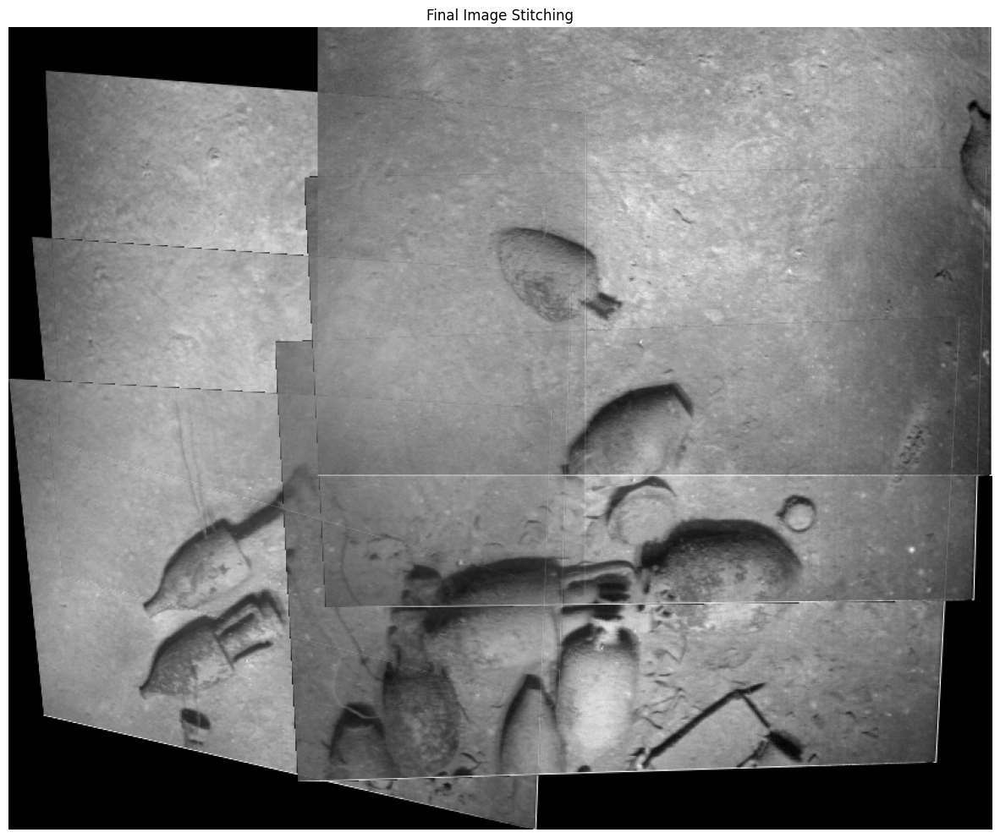

In [12]:
# Initializing the offset for the first image and starting the mosaic with the first pixel
image_offset = [0, 0] 
image_mosaic = pixel[0]

# Assigning an identity matrix to the last element in the homography list for future reference
H1_matrix[-1] = np.identity(3)

# Iterating through homographies to progressively build the mosaic
for idx in range(len(H1_matrix) - 1):
    
    # Adjusting the translation components of the homography based on current image offset
    translation_x, translation_y = image_offset
    H1_matrix[idx][0, 2] += translation_x
    H1_matrix[idx][1, 2] += translation_y

    # Accumulating transformations by matrix multiplication with previous homographies
    H1_matrix[idx] = H1_matrix[idx] @ H1_matrix[idx - 1]

    # Identify the index for the next image, wrapping around to the start if necessary
    upcoming_idx = (idx + 1) % len(keypoint_store)

    # Combining the current mosaic with the next image in sequence using the calculated homography
    image_mosaic, image_offset = combine_images(image_mosaic, pixel[upcoming_idx], H1_matrix[idx])

# Visualizing the final stitched mosaic with an increased figure size
plt.figure(figsize=(15, 15))  # Made the display size even larger
plt.imshow(image_mosaic)
plt.title("Final Image Stitching")
plt.axis('off')


### Step-7: Image Registration for Non-Sequential Pairs of Images

In [13]:
# Define the pairs to stitch (0-indexed)
pairs_to_stitch = [(0, 5), (1, 4), (1, 3), (2, 4), (0, 4), (1, 5)]

def stitch_image_pair(idx1, idx2, keypoint_store, descriptor_store, pixel):
    # Match features between the two images
    good_matches, (src_pts, dst_pts) = match_features(
        descriptor_store[idx1], descriptor_store[idx2],
        keypoint_store[idx1], keypoint_store[idx2]
    )
    
    # Ensure src_pts and dst_pts are 2D arrays with points in (x, y) format
    src_pts = np.asarray(src_pts).reshape(-1, 2)
    dst_pts = np.asarray(dst_pts).reshape(-1, 2)
    
    # Generate homography matrix
    H_matrix, _, _ = generate_homography_matrix([(src_pts, dst_pts)])
    
    # Combine images
    stitched_image, _ = combine_images(pixel[idx1], pixel[idx2], H_matrix[0])
    
    return stitched_image, good_matches

# Function to plot the stitching result
def plot_stitching_result(stitched_image, img1, img2, good_matches, keypoint_store, normalized):
    plt.figure(figsize=(20, 10))
    
    # Plot stitched image
    plt.subplot(1, 2, 1)
    plt.imshow(stitched_image)
    plt.title(f"Stitched Image {img1+1}-{img2+1}")
    plt.axis('off')
    
    # Plot matching results
    plt.subplot(1, 2, 2)
    matching_result = cv2.drawMatches(normalized[img1], keypoint_store[img1], 
                                      normalized[img2], keypoint_store[img2], 
                                      good_matches, None, matchColor=[255, 255, 0],
                                      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(matching_result)
    plt.title(f"Feature Matching {img1+1}-{img2+1}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Stitching images 1 and 6
Found 51 good matches.
Computed homography for match set 0:
 - Total points: 51
 - Inliers (selected by RANSAC): 33
 - Outliers (rejected by RANSAC): 18.0


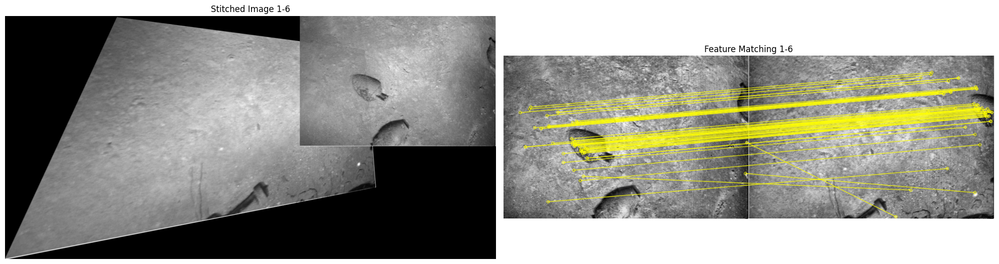

Stitching images 2 and 5
Found 39 good matches.
Computed homography for match set 0:
 - Total points: 39
 - Inliers (selected by RANSAC): 29
 - Outliers (rejected by RANSAC): 10.0


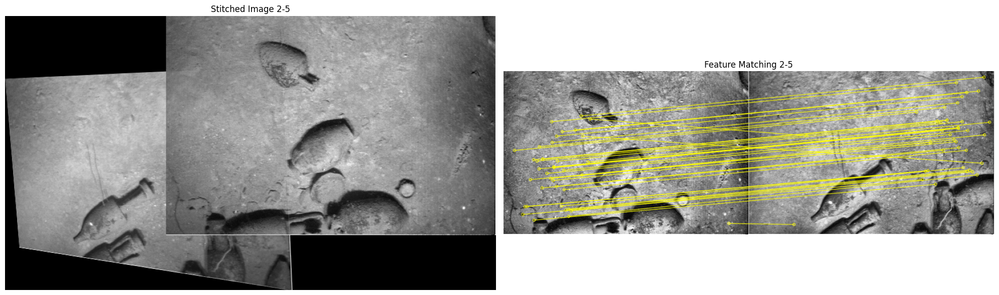

Stitching images 2 and 4
Found 14 good matches.
Computed homography for match set 0:
 - Total points: 14
 - Inliers (selected by RANSAC): 10
 - Outliers (rejected by RANSAC): 4.0


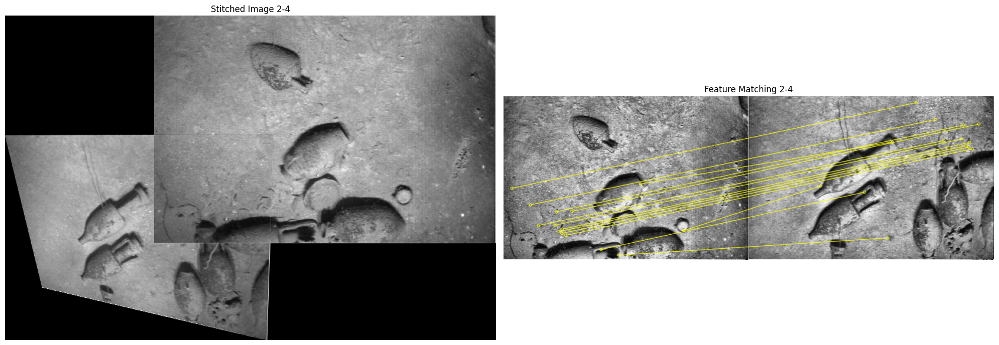

Stitching images 3 and 5
Found 27 good matches.
Computed homography for match set 0:
 - Total points: 27
 - Inliers (selected by RANSAC): 14
 - Outliers (rejected by RANSAC): 13.0


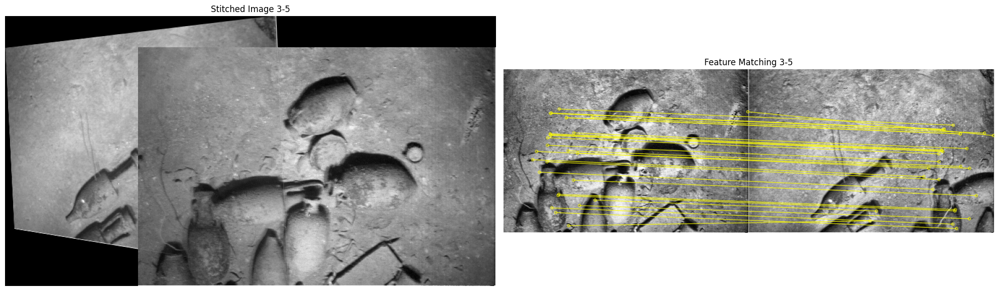

Stitching images 1 and 5
Found 8 good matches.
Computed homography for match set 0:
 - Total points: 8
 - Inliers (selected by RANSAC): 5
 - Outliers (rejected by RANSAC): 3.0


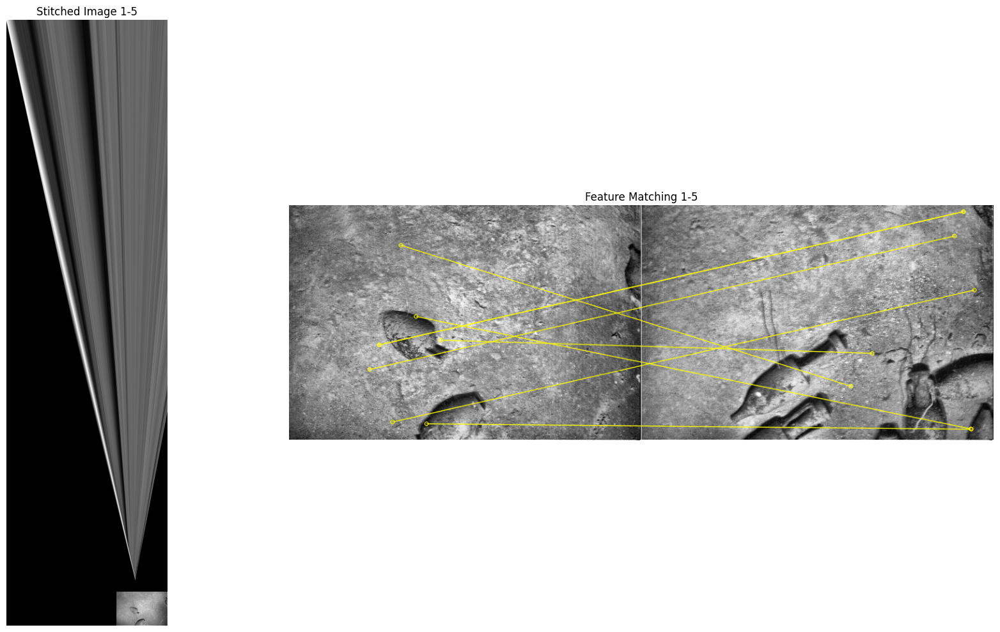

Stitching images 2 and 6
Found 62 good matches.
Computed homography for match set 0:
 - Total points: 62
 - Inliers (selected by RANSAC): 37
 - Outliers (rejected by RANSAC): 25.0


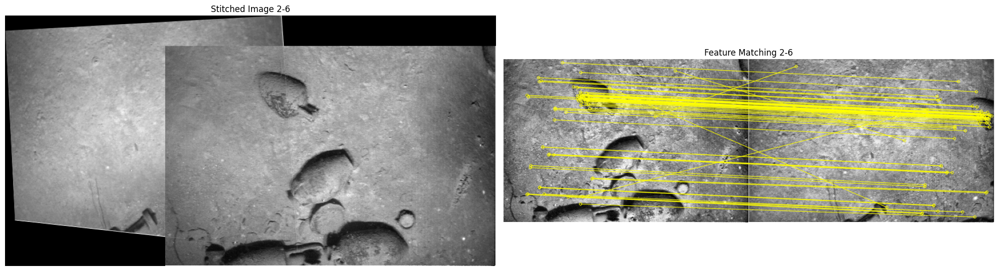

In [14]:
for idx1, idx2 in pairs_to_stitch:
    print(f"Stitching images {idx1+1} and {idx2+1}")
    stitched_image, good_matches = stitch_image_pair(idx1, idx2, keypoint_store, descriptor_store, pixel)
    plot_stitching_result(stitched_image, idx1, idx2, good_matches, keypoint_store, normalized)

**From the above results, we can see that the algorithm works well on non-sequential pairs of images as well if they have some sort of overlap. However, for the image pair 1 and 5, we can see that the image stitching just blows up. This is because there are very few good matches detected, and there's just a small portion of overlap on the botton left corner of Image 1 and top right corner of Image 5 respectively. We could improve the stitching by maybe using a feature detector better suited for small overlaps like SURF or ORB, which may detect more keypoints in the overlap region.**